## Edge Detection

1- Read and display the image "lena.png" and convert the image to grayscale.

In [1]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import convolve2d
from scipy.ndimage import convolve
import random

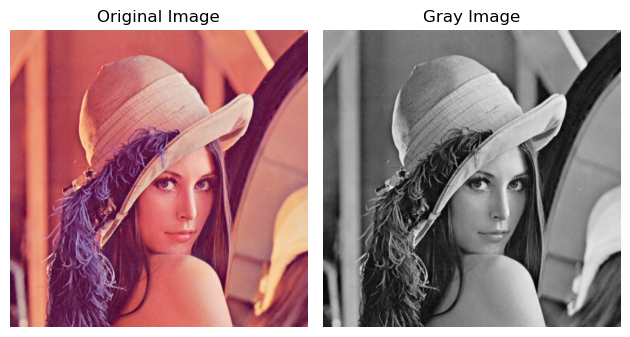

In [2]:
# Reading the image
image = cv.imread('lena.png')
image = cv.cvtColor(image, cv.COLOR_BGR2RGB)

# Converting the image to grayscale
gray_image = cv.cvtColor(image,cv.COLOR_RGB2GRAY)

# Displayin the original image
plt.subplot(121)
plt.imshow(image)
plt.title("Original Image")
plt.axis('off')

# Displaying the gray image
plt.subplot(122)
plt.imshow(gray_image, cmap='gray')
plt.title('Gray Image')
plt.axis('off')
plt.tight_layout()
plt.show()


2- For each of the operators "Roberts, Prewitt, and Sobel," calculate and display:

a. The gradient along the lines,

b. The gradient along the columns,

c. The phase of the gradient,

d. The magnitude of the gradient,

Roberts filter:

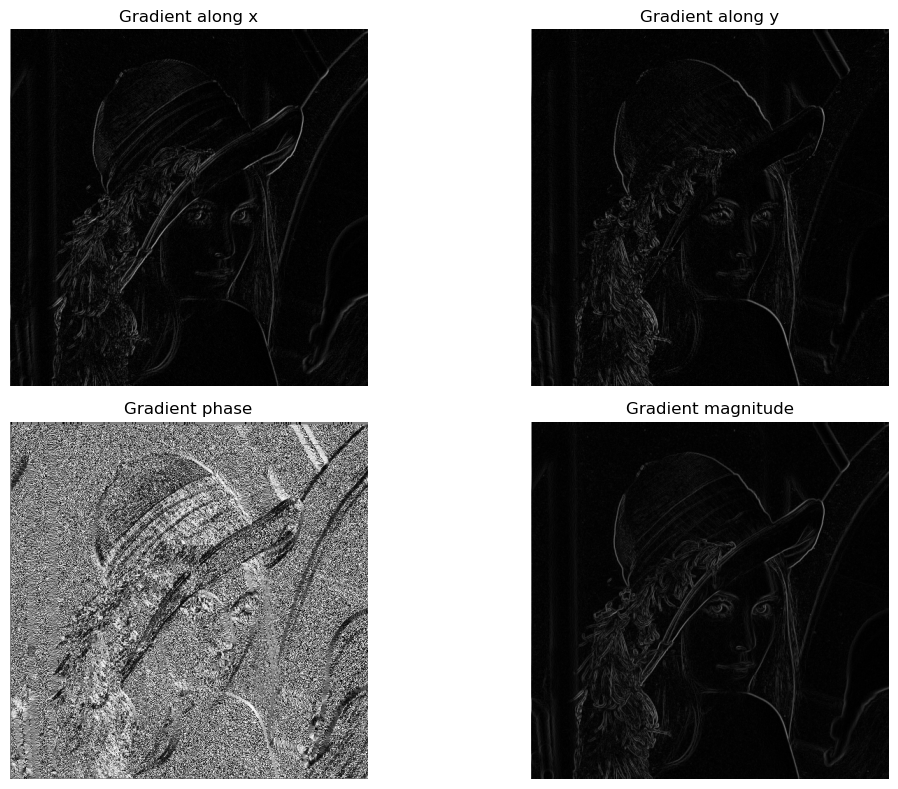

In [3]:
img_array = np.array(gray_image)
roberts_x = np.array([[1, 0], [0, -1]])
roberts_y = np.array([[0, 1], [-1, 0]])

# Convolve the image with the Roberts operators
r_gradient_x = np.abs(convolve2d(img_array, roberts_x, mode='same'))
r_gradient_y = np.abs(convolve2d(img_array, roberts_y, mode='same'))

# The phase of the gradient
r_gradient_phase = np.arctan2(r_gradient_y, r_gradient_x)

# The magnitude of the gradient
r_gradient_magnitude = np.sqrt(r_gradient_x**2 + r_gradient_y**2)

# Displaying the gradient along the lines & columns:

plt.figure(figsize = (12,8))
plt.tight_layout()

plt.subplot(2, 2, 1)
plt.imshow(r_gradient_x, cmap='gray')
plt.title('Gradient along x')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(r_gradient_y, cmap='gray')
plt.title('Gradient along y')
plt.axis('off')

# Displaying the phase & magnitude of the gradient:

plt.subplot(2, 2, 3)
plt.imshow(r_gradient_phase, cmap='gray')
plt.title('Gradient phase')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(r_gradient_magnitude, cmap='gray')
plt.title('Gradient magnitude')
plt.axis('off')
plt.tight_layout()

plt.show()


Prewitt's filter

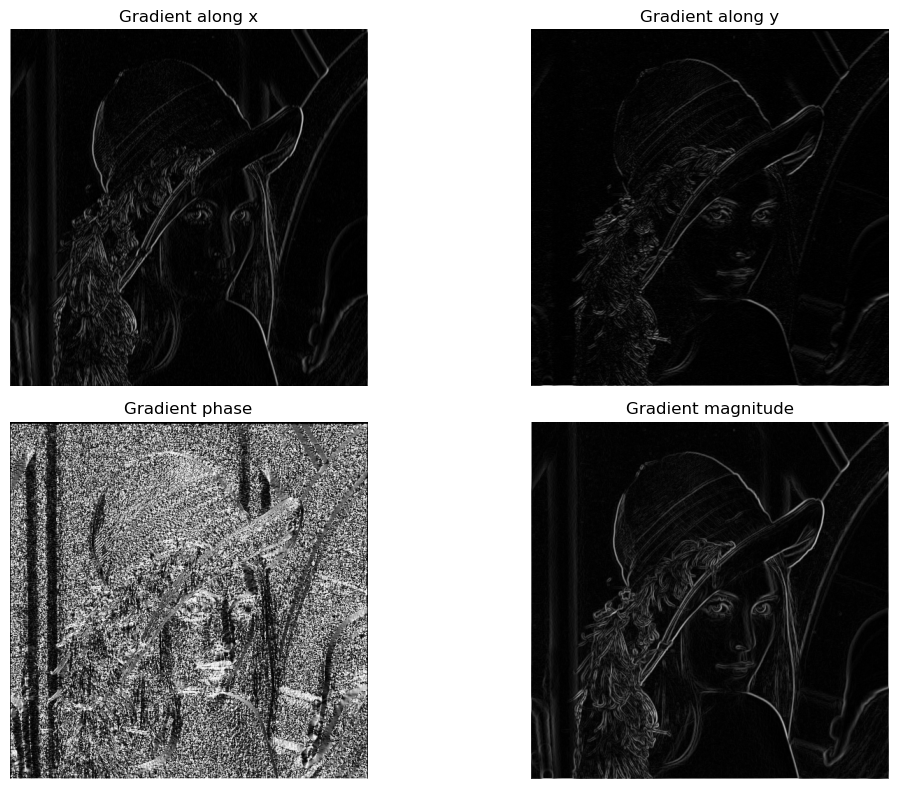

In [4]:
prewitt_x = np.array([[-1, 0, 1],
                     [-1, 0, 1],
                     [-1, 0, 1]])
prewitt_y = np.array([[-1, -1, -1],
                      [ 0,  0, 0],
                      [ 1,  1, 1]])
p_gradient_x = np.abs(convolve2d(img_array, prewitt_x, mode = 'same'))
p_gradient_y = np.abs(convolve2d(img_array, prewitt_y, mode = 'same'))
p_gradient_phase = np.arctan2(p_gradient_y, p_gradient_x)
p_gradient_magnitude = np.sqrt(p_gradient_x ** 2 + p_gradient_y ** 2)
# Displaying the gradient along the lines & columns:

plt.figure(figsize = (12,8))

plt.subplot(2, 2, 1)
plt.imshow(p_gradient_x, cmap='gray')
plt.title('Gradient along x')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(p_gradient_y, cmap='gray')
plt.title('Gradient along y')
plt.axis('off')

# Displaying the phase & magnitude of the gradient:

plt.subplot(2, 2, 3)
plt.imshow(p_gradient_phase, cmap='gray')
plt.title('Gradient phase')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(p_gradient_magnitude, cmap='gray')
plt.title('Gradient magnitude')
plt.axis('off')
plt.tight_layout()
plt.show()

Sobel's filter

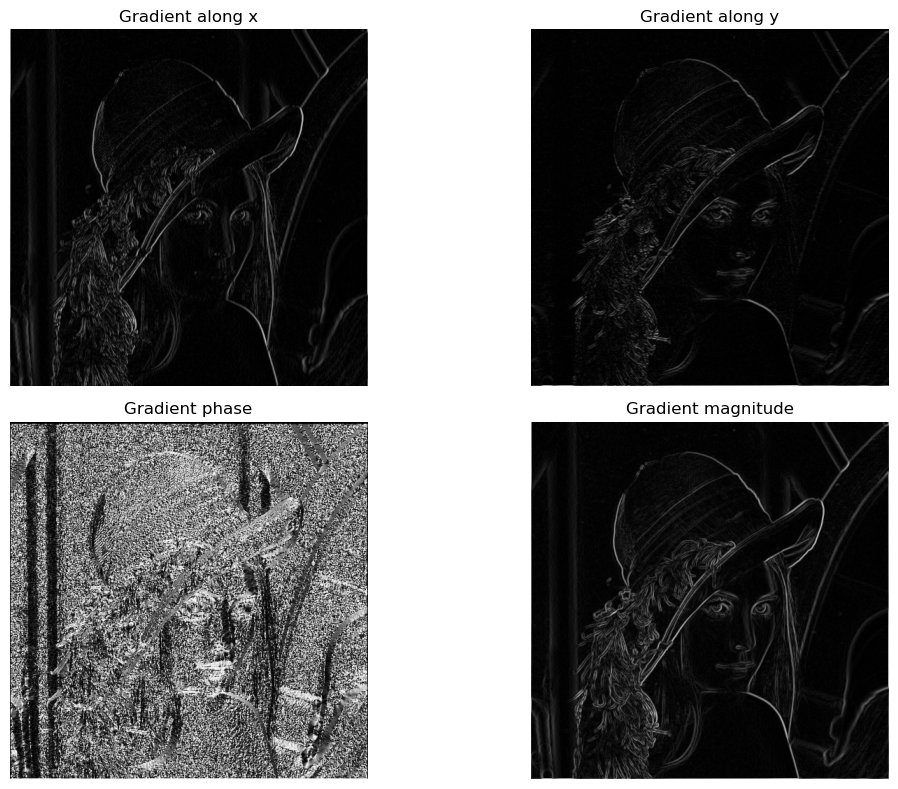

In [5]:
sobel_x = np.array([[-1, 0, 1],
                     [-2, 0, 2],
                     [-1, 0, 1]])
sobel_y = np.array([[-1, -2, -1],
                      [ 0,  0, 0],
                      [ 1,  2, 1]])
s_gradient_x = np.abs(convolve2d(img_array, sobel_x, mode = 'same'))
s_gradient_y = np.abs(convolve2d(img_array, sobel_y, mode = 'same'))
s_gradient_phase = np.arctan2(s_gradient_y, s_gradient_x)
s_gradient_magnitude = np.sqrt(s_gradient_x ** 2 + s_gradient_y ** 2)
# Displaying the gradient along the lines & columns:

plt.figure(figsize = (12,8))
plt.subplot(2, 2, 1)

plt.imshow(s_gradient_x, cmap='gray')
plt.title('Gradient along x')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(s_gradient_y, cmap='gray')
plt.title('Gradient along y')
plt.axis('off')

# Displaying the phase & magnitude of the gradient:

plt.subplot(2, 2, 3)
plt.imshow(s_gradient_phase, cmap='gray')
plt.title('Gradient phase')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(s_gradient_magnitude, cmap='gray')
plt.title('Gradient magnitude')
plt.axis('off')
plt.tight_layout()

3- Compare between the 3 operators:

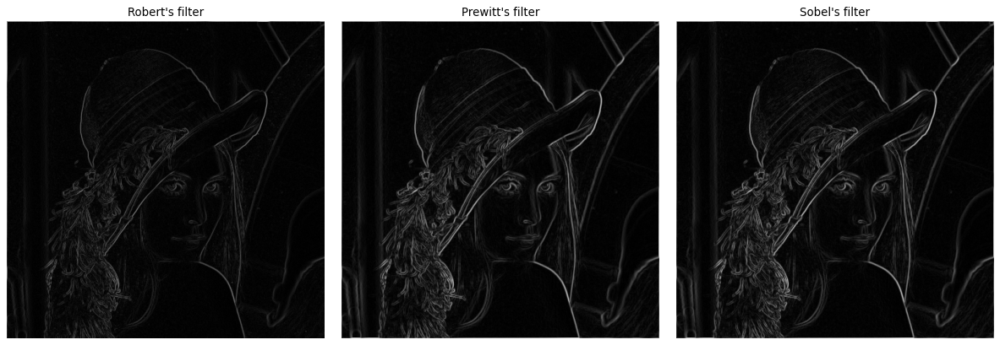

In [6]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5), dpi=80)

# Plot the first image
axes[0].imshow(r_gradient_magnitude, cmap='gray')
axes[0].set_title("Robert's filter")
axes[0].axis('off')

# Plot the second image
axes[1].imshow(p_gradient_magnitude, cmap='gray')
axes[1].set_title("Prewitt's filter")
axes[1].axis('off')

# Plot the third image
axes[2].imshow(s_gradient_magnitude, cmap='gray')
axes[2].set_title("Sobel's filter")
axes[2].axis('off')

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

Comparaison between the three operators:
- We can clearly see that the Sobel & Prewitt filter provide a better result than the Robert's filter, the edges of the picture are thicker and more visible.
- The edges of the Sobel filter are slightly more thick than the Prewitt filter.

4- Take the original image again, calculate and display the Laplacian for 4-connectivity and 8-connectivity. 

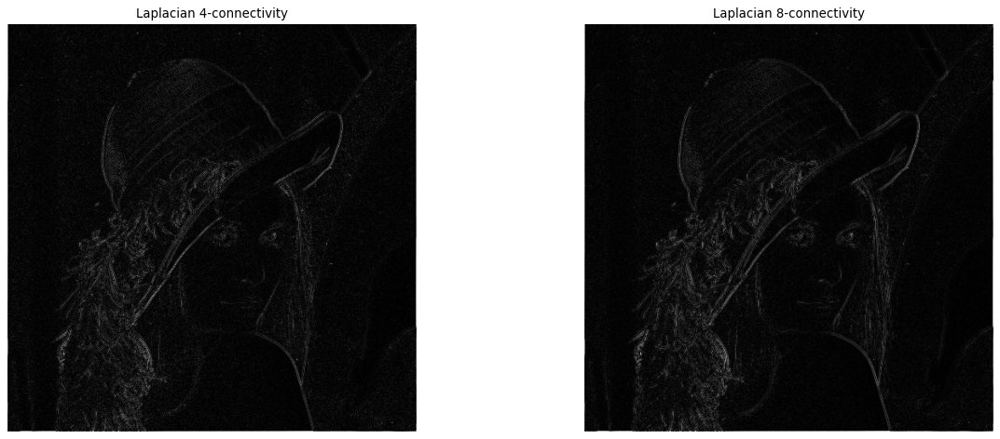

In [7]:
# Laplacian 4-connectivity:
l4 = np.array([[ 0, 1, 0],
               [ 1,-4, 1],
               [ 0, 1, 0]])
l4filter = np.abs(convolve2d(img_array, l4, mode='same'))

fig, ax = plt.subplots(1, 2, figsize=(17, 6), dpi=80)

ax[0].imshow(l4filter, cmap='gray')
ax[0].set_title("Laplacian 4-connectivity")
ax[0].axis('off')

# Laplacien 8-connectivity
l8 = np.array([[ 1, 1, 1],
               [ 1,-8, 1],
               [ 1, 1, 1]])
l8filter = np.abs(convolve2d(img_array, l8, mode='same'))
ax[1].imshow(l8filter, cmap='gray')
ax[1].set_title('Laplacian 8-connectivity')
ax[1].axis('off')

plt.tight_layout()
plt.show()

5- Compare between the two last

 The 8-connectivity Laplacian gave better results than the 4-connectivity Laplacian, however they are both affected by a
significant amount of noise.

6- In order to improve the obtained result, apply Gaussian filtering before calculating the 8-connectivity Laplacian. Display the result.

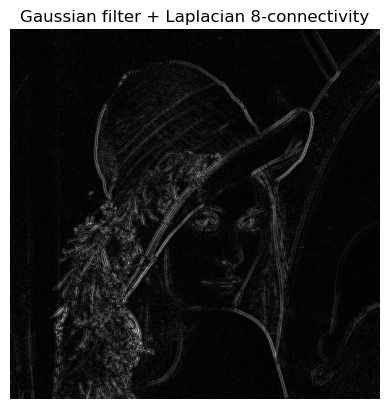

In [8]:
gaussian = cv.GaussianBlur(img_array,(3,3),0)
l8filter = cv.Laplacian(gaussian, 3)
plt.imshow(np.abs(l8filter), cmap='gray')
plt.title('Gaussian filter + Laplacian 8-connectivity')
plt.axis('off')
plt.show()

7- Apply the Laplacian enhancement method through thresholding.

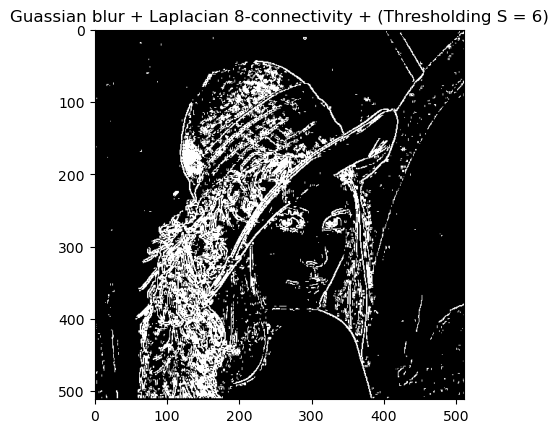

In [9]:
laplacian = l8filter
neighborhood_size = 3

laplacian_enhanced = np.zeros_like(laplacian, dtype=np.uint8)

# Defining the threshold parameter S (empirical choice)
S = 6
height, width = laplacian.shape

for i in range(1, height - 1):
    for j in range(1, width - 1):
        # Extract the centered neighborhood
        neighborhood = laplacian[i-1:i+2, j-1:j+2]
        
        m = np.min(neighborhood)
        M = np.max(neighborhood)
        if m < -S and M > S:
            laplacian_enhanced[i, j] = 255
            
plt.imshow(laplacian_enhanced, cmap='gray')
plt.title('Guassian blur + Laplacian 8-connectivity + (Thresholding S = 6)')
plt.show()


## Conclusion:

The purpose of edge detection operations is to transform an image into another image of the same dimensions, where contours conventionally appear in white on a black background. This is achieved by using high-pass filters to emphasize the details of the image and eliminate homogeneous regions. 

* Robert's operator is sensitive to noise since it uses only a 2*2 convolution mask.

* The advantage of Prewitt & Soble's operators is that they reduce noise. They are both more sensitive to vertical & horisozontal edges than diagonal edges.

* The Sobel filter provides a better estimation than the Prewitt filter since it approximates a Gaussian (1,2,1) while the Prewitt aproximates a mean (1,1,1).

* The 8-connected Laplacian filter better defines the contours of the image than the 4-connected Laplacian but introduces a significant amount of noise to the image. Attempting to apply a Gaussian filter before calculating the 8-connected Laplacian improves the result (noise elimination) but introduces double contours. To address this issue, the enhancement method by thresholding is applied, yielding a better result but introduces the problem of discontinuity (open contours) as a trade-off. The challenge lies in selecting the optimal threshold value for each image.

**Gradient-based** edge detection methods are less affected by noise. However, a trade-off is that they tend to make edges appear thicker.

**Laplacian-based** edge detection methods, on the other hand, are highly sensitive to noise. To mitigate this, a blurring filter is usually applied beforehand. However, they have the advantage of being rotationally invariant. They can effectively detect edges regardless of their orientation – whether vertical, horizontal, or diagonal.




## Contrast improvement

1. Read and display the image " x "

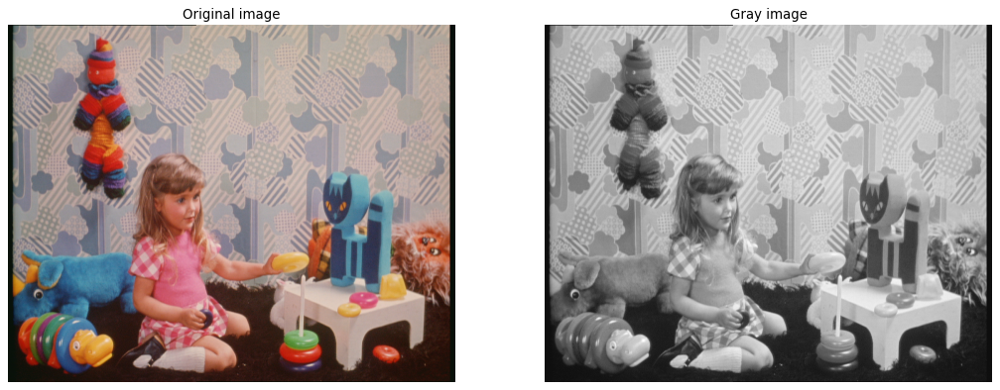

In [10]:
image_x = cv.imread('girl.bmp')
image_x = cv.cvtColor(image_x, cv.COLOR_BGR2RGB)
gray_x = cv.cvtColor(image_x, cv.COLOR_RGB2GRAY)
gray_array = np.array(gray_x)
fig, ax = plt.subplots(1,2, figsize = (16,12), dpi = 80)
ax[0].imshow(image_x)
ax[0].set_title('Original image')
ax[0].axis('off')
ax[1].imshow(gray_array, cmap = 'gray')
ax[1].set_title('Gray image')
ax[1].axis('off')
plt.show()

2. Use the three filters introduced in the course in the enhacement section. Comment.

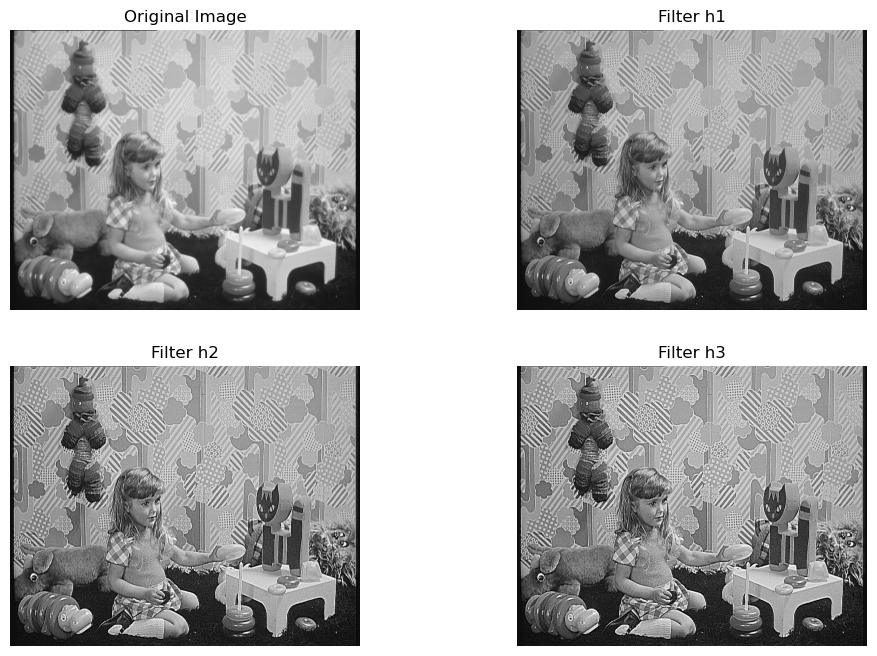

In [11]:
# Defining the filters:

h1 = np.array([[0, -1, 0],
               [-1, 5, -1],
               [0, -1, 0]])

h2 = np.array([[-1, -1, -1],
               [-1, 9, -1],
               [-1, -1, -1]])

h3 = np.array([[-1, -2, -1],
               [-1, 11, -1],
               [-1, -2, -1]])

# Applying each filter individually to the grayscale image
filtered_image_h1 = cv.filter2D(gray_array,-1, h1)
filtered_image_h2 = cv.filter2D(gray_array,-1, h2)
filtered_image_h3 = cv.filter2D(gray_array,-1, h3)

plt.figure(figsize=(12, 8))
plt.tight_layout()

plt.subplot(2, 2, 1)
plt.imshow(gray_array, cmap='gray')
plt.title("Original Image")
plt.axis("off")

plt.subplot(2, 2, 2)
plt.imshow(filtered_image_h1, cmap='gray')
plt.title("Filter h1")
plt.axis("off")

plt.subplot(2, 2, 3)
plt.imshow(filtered_image_h2, cmap='gray')
plt.title("Filter h2")
plt.axis("off")

plt.subplot(2, 2, 4)
plt.imshow(filtered_image_h3, cmap='gray')
plt.title("Filter h3")
plt.axis("off")

plt.show()


- The three filters induce a sharpening effect on the original image.
- The more sharp is the image the more noisy it becomes.
- The h2 filter gave the best result with this image, as it gives decent sharpening without compromising the quality of the image by adding noise.


3. Use a Gamma correction with Gamma = 0.8, 1.2 and 1.0001. Comment.

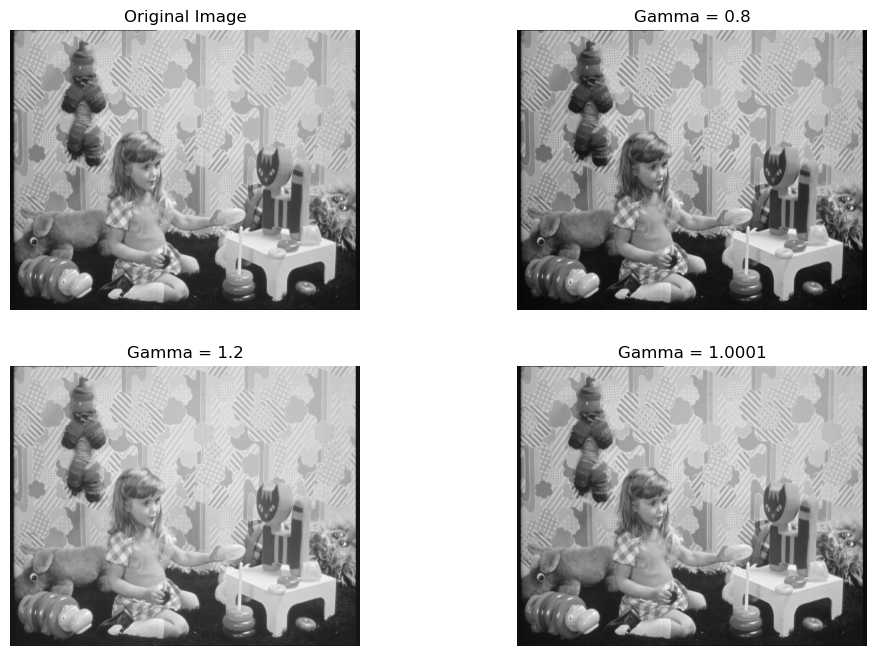

In [12]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

def adjust_gamma(image, gamma=1):
    invgamma = 1.0 / gamma
    table = np.array([((i/255) ** invgamma)*255 for i in np.arange(0, 256)])
    lut_img = cv.LUT(image.astype(np.uint8), table.astype(np.uint8))
    return lut_img

plt.figure(figsize=(12, 8))
plt.tight_layout()
plt.subplot(2, 2, 1)
plt.imshow(gray_array, cmap='gray')
plt.title("Original Image")
plt.axis("off")

plt.subplot(2, 2, 2)
plt.imshow(adjust_gamma(gray_array, 0.8), cmap='gray')
plt.title("Gamma = 0.8")
plt.axis("off")

plt.subplot(2, 2, 3)
plt.imshow(adjust_gamma(gray_array, 1.2), cmap='gray')
plt.title("Gamma = 1.2")
plt.axis("off")

plt.subplot(2, 2, 4)
plt.imshow(adjust_gamma(gray_array, 1.0001), cmap='gray')
plt.title("Gamma = 1.0001")
plt.axis("off")

plt.show()


4. Choose a piecewise linear transformation to improve the contrast and apply it. Comment.

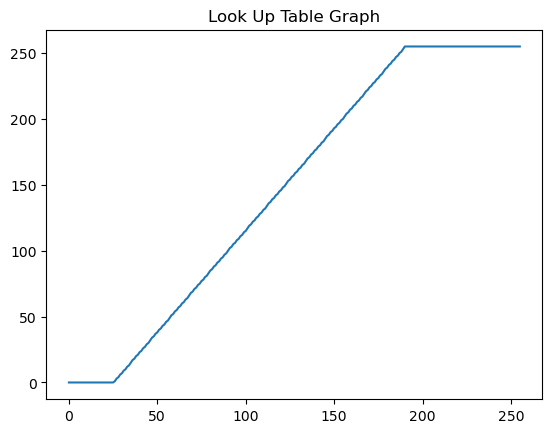

In [13]:
# Defining I_min & I_max for the look up table:
i_min = 25
i_max = 190

# Creating the look up table:
table = np.array([0 if i < i_min else 255 if i >= i_max else int((255 * (i - i_min)) / (i_max - i_min)) for i in range(256)])

# Transforming the original pixel values using LUT:
lut_img = cv.LUT(gray_array, table.astype(np.uint8))

# Plotting the piecewise linear transformation graph:
plt.plot(table)
plt.title('Look Up Table Graph')
plt.show()

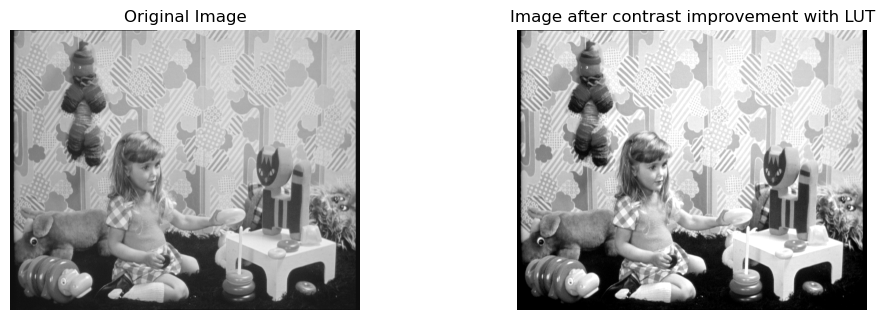

In [14]:
# Plotting the image after the contrast improvement using lUT:
plt.figure(figsize = (12,8))

plt.subplot(2, 2, 1)
plt.imshow(gray_array, cmap = 'gray')
plt.title('Original Image')
plt.axis('off')
plt.subplot(2,2,2)
plt.imshow(lut_img, cmap = 'gray')
plt.title('Image after contrast improvement with LUT')
plt.axis('off')
plt.show()

*Comments:*
- Improving the contrast helps to improve the sharpness and clarity of the details within the image.

## Conclusion:

**Sharpening filters:** 
Sharpening filters,help make the edges and details in an image stand out more. They work by emphasizing high-frequency components, making edges appear more defined. However, it's crucial to be careful not to add too much extra 'noise' or unwanted details during this sharpening process.

**Gama correction:**
Gamma correction is used for adjusting the brightness levels in an image. By applying gamma correction, one can achieve more accurate and visually pleasing representations, ensuring that the perceived brightness is consistent across different devices.

**Contrast improvement:**
Contrast enhancement techniques aim to improve the difference in intensity between different regions of an image. 

Depending on the specific characteristics of the image, a combination of these methods can be used to produce the best result. Finding the right balance is key to getting the best results without introducing any side effects.

## Filtering in frequency domain


1. Read and display the image "goldhill.bmp." and onvert the image to grayscale.

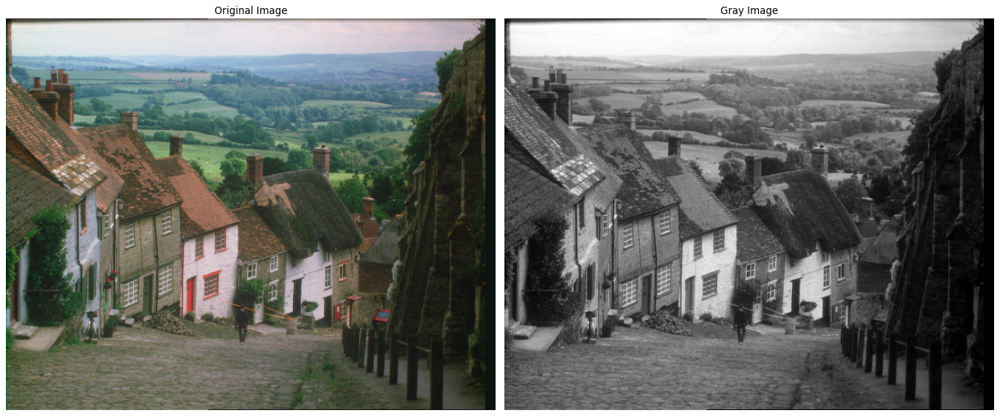

In [15]:
goldhill = cv.imread('goldhill.bmp')
goldhill = cv.cvtColor(goldhill,cv.COLOR_BGR2RGB)
goldhill = np.array(goldhill)
gray_goldhill = cv.imread('goldhill.bmp', cv.IMREAD_GRAYSCALE)
fig, ax = plt.subplots(1, 2, figsize=(17, 7), dpi=80)

ax[0].imshow(goldhill, cmap='gray')
ax[0].axis('off')
ax[0].set_title('Original Image')
ax[1].imshow(gray_goldhill, cmap = 'gray')
ax[1].axis('off')
ax[1].set_title('Gray Image')
plt.tight_layout()
plt.show()

2. Add Gaussian noise to the image with a mean of zero and a standard deviation of σ = 0.01.

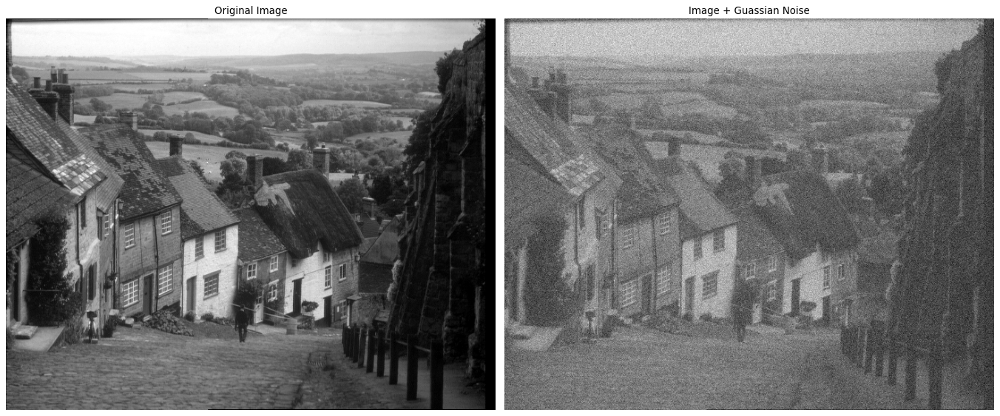

In [16]:
# Normalizing the image:
goldhill_normalized = gray_goldhill / 255
mean = 0
std = 0.1
x, y = goldhill_normalized.shape
random.seed(14)
g_noise = np.random.normal(mean, std, size = (x,y))
noisy_goldhill = goldhill_normalized + g_noise

fig, ax = plt.subplots(1, 2, figsize=(17, 12), dpi=80)
ax[0].imshow(gray_goldhill, cmap='gray')
ax[0].axis('off')
ax[0].set_title('Original Image')
ax[1].imshow(noisy_goldhill, cmap = 'gray')
ax[1].axis('off')
ax[1].set_title('Image + Guassian Noise')
plt.tight_layout()
plt.show()

3. Calculate the discrete Fourier transform of the image using the functions np.fft (search for it) .

In [17]:
# Calculating the fourier transform of the image
X1 = np.fft.fft2(gray_goldhill)
X2 = np.fft.fft2(noisy_goldhill)

4. Display the spectrum of the image.

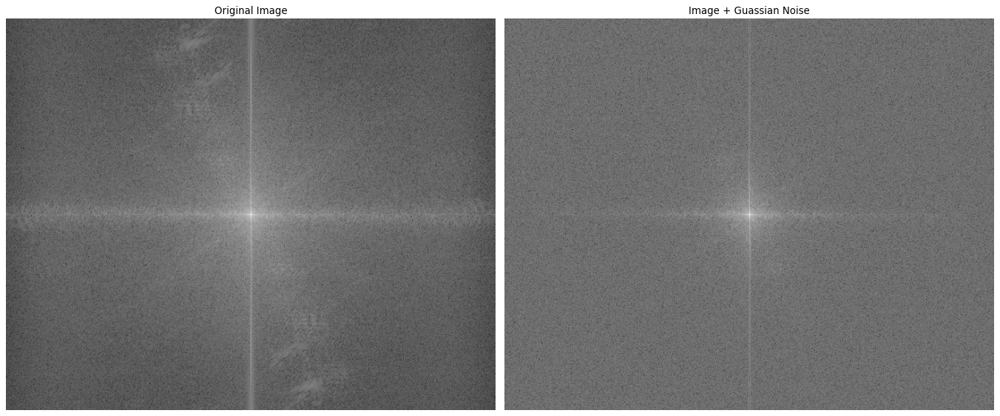

In [18]:
X1_shift = np.fft.fftshift(X1)
magnitude_spectrum1 = np.log(np.abs(X1_shift))
X2_shift = np.fft.fftshift(X2)
magnitude_spectrum2 = np.log(np.abs(X2_shift))
fig, ax = plt.subplots(1, 2, figsize=(17, 12), dpi=80)
ax[0].imshow(magnitude_spectrum1, cmap='gray')
ax[0].axis('off')
ax[0].set_title('Original Image')
ax[1].imshow(magnitude_spectrum2, cmap='gray')
ax[1].axis('off')
ax[1].set_title('Image + Guassian Noise')
plt.tight_layout()
plt.show()

5. Generate and display the transfer function of the filter H, which is a low pass filter having a cutting frequency D0=40.

Text(0.5, 1.0, 'Spectrum of the Butterworth filter')

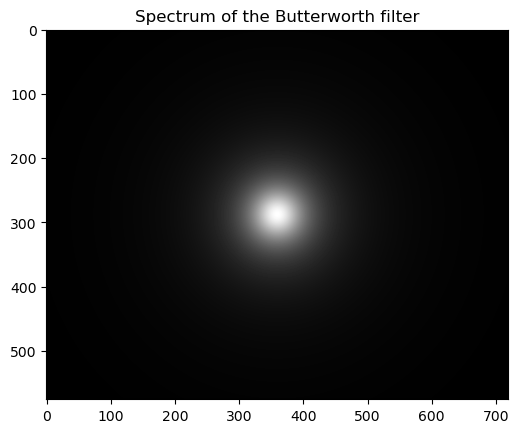

In [19]:
# Butterworth filter 1st order
M, N = X1.shape
D0 = 40
order = 1
H = np.zeros((M, N))
n = order
for u in range(M):
    for v in range(N):
        D = np.sqrt((u - M/2)**2 + (v - N/2)**2 )
        H[u, v] = 1 / ( 1 + (( D / D0)**(2*n)))
plt.imshow(H, cmap='gray')
plt.title('Spectrum of the Butterworth filter')

6. Filter the spectrum of the image using the function previously generated (H).

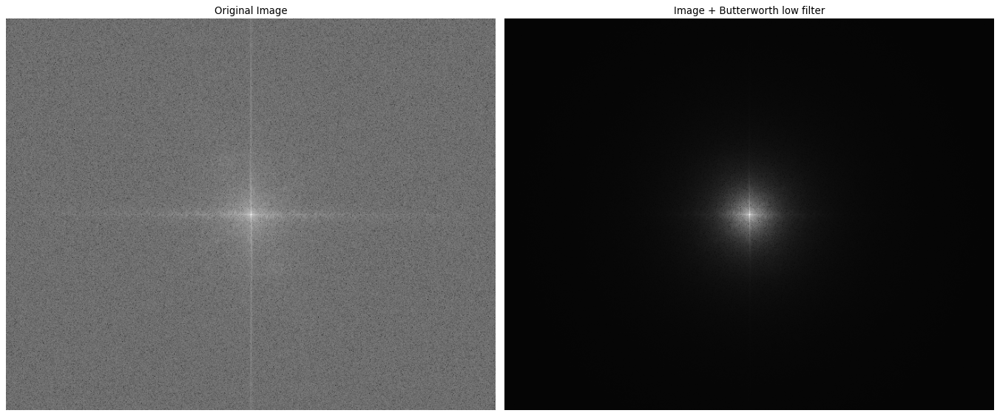

In [20]:
filtered_img = magnitude_spectrum2 * H

fig, ax = plt.subplots(1, 2, figsize=(17, 12), dpi=80)
ax[0].imshow(magnitude_spectrum2, cmap='gray')
ax[0].axis('off')
ax[0].set_title('Original Image')
ax[1].imshow(filtered_img, cmap='gray')
ax[1].axis('off')
ax[1].set_title('Image + Butterworth low filter')
plt.tight_layout()
plt.show()


7. Reconstruct the image (filtered one ofc) and display it.

Text(0.5, 1.0, 'Image after Butterworth low-pass filter')

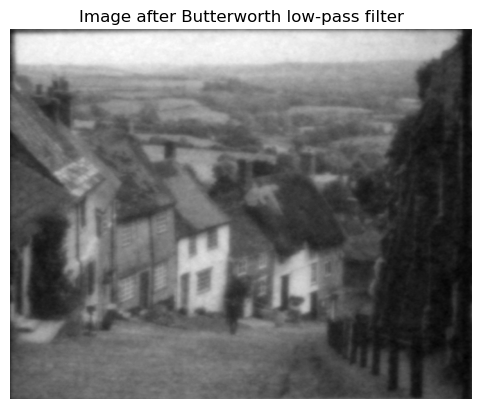

In [21]:
recostructed_img = np.fft.ifftshift(X2_shift * H)
recostructed_img = np.abs(np.fft.ifft2(recostructed_img))
plt.imshow(recostructed_img, cmap='gray')
plt.axis('off')
plt.title('Image after Butterworth low-pass filter')

8. Apply a high pass filter following the same steps.

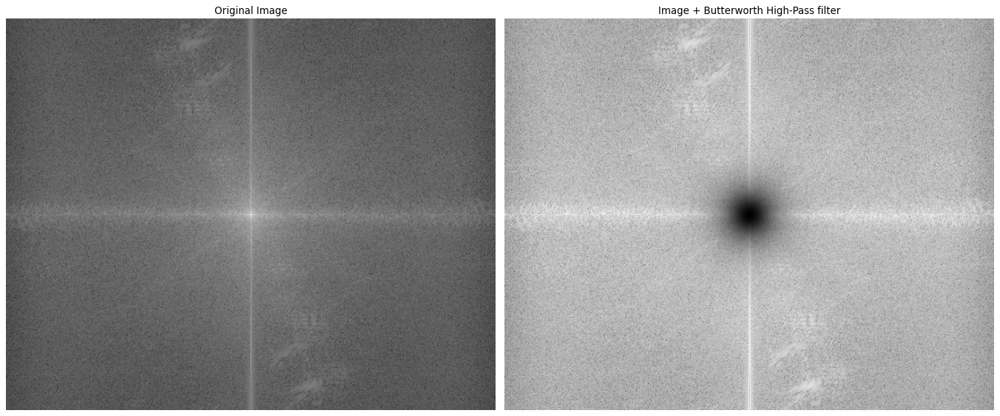

In [22]:
# Butterworth High-Pass filter
# Hhp(u, v) = 1 - Hlp(u, v) with D0 = 40, order = 1
H2 = 1 - H

filtered_img = magnitude_spectrum1 * H2

fig, ax = plt.subplots(1, 2, figsize=(17, 12), dpi=80)
ax[0].imshow(magnitude_spectrum1, cmap='gray')
ax[0].axis('off')
ax[0].set_title('Original Image')
ax[1].imshow(filtered_img, cmap='gray')
ax[1].axis('off')
ax[1].set_title('Image + Butterworth High-Pass filter')
plt.tight_layout()
plt.show()


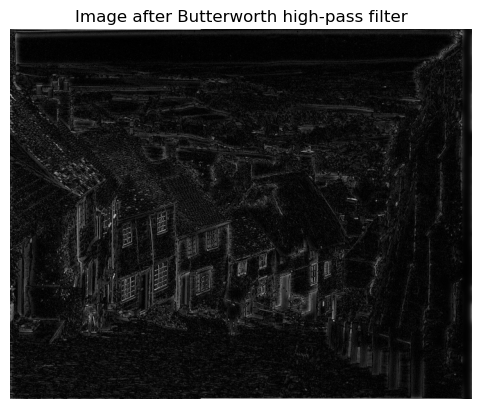

In [23]:
recostructed_img = np.fft.ifftshift(X1_shift * H2)
recostructed_img = np.abs(np.fft.ifft2(recostructed_img))
plt.imshow(recostructed_img, cmap='gray')
plt.axis('off')
plt.title('Image after Butterworth high-pass filter')
plt.show()

9. Perform a bandpass filtering following the same steps.

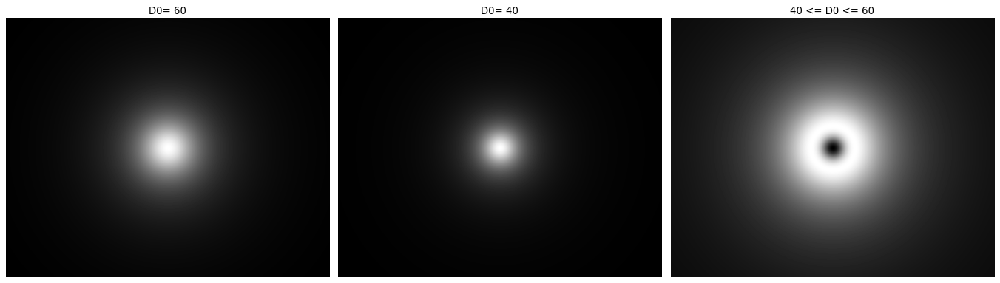

In [24]:
# To get a bandpass filter we can create two filters with varrying cutting frequencies and substract the two
# A band pass filter for a frequency D where: 40 <= D <= 60 where D is the frequency

# Butterworth low-pass filter with D0 = 60 and order = 1
M, N = X1.shape
D1 = 60
order = 1
H1 = np.zeros((M, N))
n = order
for u in range(M):
    for v in range(N):
        D = np.sqrt((u - M/2)**2 + (v - N/2)**2 )
        H1[u, v] = 1 / ( 1 + (( D / D1)**(2*n)))

fig, ax = plt.subplots(1, 3, figsize=(17, 12), dpi=80)
ax[0].imshow(H1, cmap='gray')
ax[0].axis('off')
ax[0].set_title('D0= 60')

# Butterworth low-pass filter with D0 = 40 and order = 1
D2 = 40
order = 1
H2 = np.zeros((M, N))
n = order
for u in range(M):
    for v in range(N):
        D = np.sqrt((u - M/2)**2 + (v - N/2)**2 )
        H2[u, v] = 1 / ( 1 + (( D / D2)**(2*n)))

ax[1].imshow(H2, cmap='gray')
ax[1].axis('off')
ax[1].set_title('D0= 40')

H3 = H1 - H2

ax[2].imshow(H3, cmap='gray')
ax[2].axis('off')
ax[2].set_title('40 <= D0 <= 60')
plt.tight_layout()
plt.show()


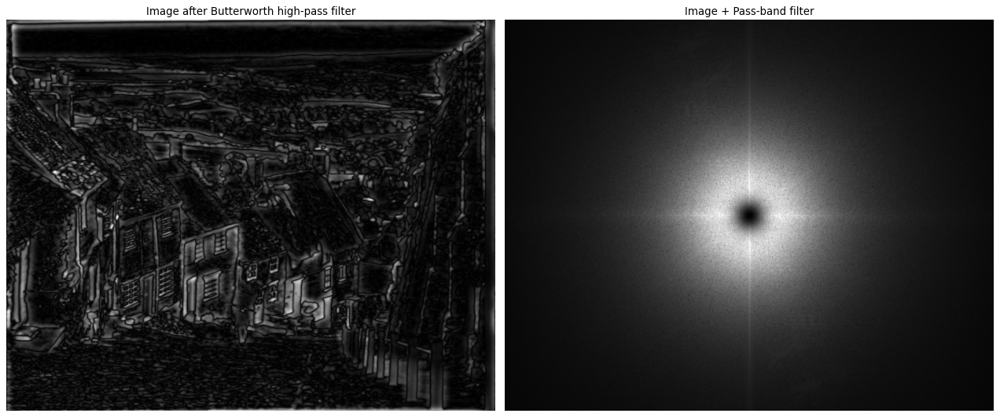

In [25]:
filtered_img = magnitude_spectrum1 * H3
recostructed_img = np.fft.ifftshift(X1_shift * H3)
recostructed_img = np.abs(np.fft.ifft2(recostructed_img))

fig, ax = plt.subplots(1, 2, figsize=(16, 8), dpi=80)
ax[0].imshow(recostructed_img, cmap='gray')
ax[0].axis('off')
ax[0].set_title('Image after Butterworth high-pass filter')
ax[1].imshow(filtered_img, cmap='gray')
ax[1].axis('off')
ax[1].set_title('Image + Pass-band filter')
plt.tight_layout()
plt.show()

## Conclusion:

- Visualising images in the frequency domaine enables the differentiation between useful signals and unwanted noise. Useful signals have low frequencies, while noise tends to manifest as high frequencies.
- Applying a low-pass filter on an image eliminates the high frequencies, thus removing the noise in the picture. However, this process tends to smoothen the image, leading to a loss of details.
- Applying a high-pass filter removes the lower frequencies in an image, emphasizing the edges. All edge detection filters can be categorized as high-pass filters.
- A band pass filter allows selective focus on a specefic frequency. It useful to emphasize a particular aspect of an image such as texture and noise.
- A butterworth filter provides a smooth transition from white to black resolting in no oscillatory phenomena. It represents a balanced compromise between the ideal filter and the Gaussian filter.
- Filtering in the frequency domain, as opposed to directly convolving the image with the filter, demands fewer calculations, resulting in significantly shorter processing times.